# Hospital Readmission for Diabetic Patients - Modelling

In [127]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

np.random.seed(42) # Set random_state=42

sns.set_style('darkgrid')
pd.options.display.float_format = "{:.3f}".format

## Data Cleaning 

Refer to Notebook 1 - EDA for details

In [2]:
diabetes = pd.read_csv(r'/Users/lilychen/Desktop/Institute of Data/Capstone/diabetic_data.csv')

In [3]:
# Replace ? as nan
diabetes = diabetes.replace('?',np.nan)  

In [4]:
## Drop out patients that have passed away during the encounter
# ~ = is not in 
diabetes = diabetes[~diabetes.discharge_disposition_id.isin([11,19,20,21])]

In [5]:
# Drop out ID-related columns
# Drop out columns high in missing values 

id_list = ['encounter_id', 'patient_nbr', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id']
high_nan_list = ['weight', 'payer_code', 'medical_specialty']
diabetes.drop(columns=id_list + high_nan_list, inplace=True)
diabetes.dropna(subset=['race'], inplace=True)

In [6]:
# Drop out diag columns as too many unique numbers, hard to classify 
diag_list = ['diag_1', 'diag_2', 'diag_3']
diabetes.drop(columns=diag_list, inplace=True)

In [7]:
# Combine readmitted columns to binary outcome: 
diabetes['readmitted'] = diabetes['readmitted'].apply(lambda x: 1 if x == '<30' else 0)

In [8]:
# Remove patient with Unknown/Invalid gender 
# Replace Female=0, Male=1
diabetes = diabetes.loc[diabetes['gender'] != 'Unknown/Invalid'] 
diabetes['gender'] = diabetes['gender'].apply(lambda x: 0 if x == 'Female' else 1)                  

In [9]:
# creating a list of dataframe columns 
# columns1 = diabetes.columns[16:33].to_list()
# columns2 = diabetes.columns[34:39].to_list()
columns1 = diabetes.columns[diabetes.columns.get_loc('metformin'):diabetes.columns.get_loc('citoglipton')+1].to_list()
columns2 = diabetes.columns[diabetes.columns.get_loc('glyburide-metformin'):diabetes.columns.get_loc('metformin-pioglitazone')+1].to_list()
col_list = columns1 + columns2


# Convert all meds to 1=takes med (up, down, steady) and 0=not taking meds (no) 
for i in col_list: 
    temp_colname = str(i) + 'temp'
    diabetes[temp_colname] = diabetes[i].apply(lambda x: 0 if x == 'No' else 1)
    
diabetes['num_prescribed_meds'] = 0   
for i in col_list:
    temp_colname = str(i) + 'temp'
    diabetes['num_prescribed_meds'] = diabetes['num_prescribed_meds'] + diabetes[temp_colname]    
    del diabetes[temp_colname]

In [10]:
# Convert all meds to 1=change in med (up, down) and 0=no change in med (no, Steady) 
for i in col_list: 
    temp_colname = str(i) + 'temp'
    diabetes[temp_colname] = diabetes[i].apply(lambda x: 0 if (x == 'No' or x == 'Steady') else 1)

diabetes['numchange_med_dosage'] = 0   
for i in col_list:
    temp_colname = str(i) + 'temp'
    diabetes['numchange_med_dosage'] = diabetes['numchange_med_dosage'] + diabetes[temp_colname]    
    del diabetes[temp_colname]
    
# Drop the meds columns 
diabetes.drop(columns=col_list, inplace=True)

In [11]:
# insulin_related columns
diabetes['insulin_administration'] = diabetes['insulin'].apply(lambda x: 0 if x == 'No' else 1)
diabetes['insulin_dosage_change'] = diabetes['insulin'].apply(lambda x: 1 if (x == 'Down' or x == 'Up') else 0)

In [12]:
# Drop unneeded columns 
col_drop = ['insulin', 'change', 'diabetesMed'] 
diabetes.drop(columns=col_drop, inplace=True)

In [13]:
age_dict = {'[0-10)':0,
            '[10-20)':10,
            '[20-30)':20,
            '[30-40)':30,
            '[40-50)':40,
            '[50-60)':50,
            '[60-70)':60,
            '[70-80)':70,
            '[80-90)':80,
            '[90-100)':90}
diabetes['age'] = diabetes['age'].replace(age_dict)

In [14]:
diabetes.drop(columns=['max_glu_serum', 'A1Cresult', 'race'], inplace=True)

In [15]:
diabetes.rename(columns={"time_in_hospital": 'days_in_hospital'}, inplace=True)

In [16]:
# Rearrange the columns so that the outcome variable column 'readmitted' is at the end
diabetes = diabetes.drop(columns=['readmitted']).assign(readmitted=diabetes['readmitted'])

## Data Directory 

- gender: 0 = Female, 1 = Male

- age: Grouped in 10-year intervals: [0-10), [10-20), ..., [90-100)

- days_in_hospital: Number of days between admission and discharge

- num_lab_procedures: Number of lab tests performed during the encounter

- num_procedures: Number of procedures (other than lab tests) performed during the encounter

- num_medications: Number of distinct generic names administered during the encounter

- number_outpatient: Number of outpatient visits of the patient in the year preceding the encounter

- number_emergency: Number of emergency visits of the patient in the year preceding the encounter

- number_inpatient: Number of inpatient visits of the patient in the year preceding the encounter

- number_diagnoses: Number of diagnoses entered to the system

- num_prescribed_meds: Number of diabetic medication prescribed

- numchange_med_dosage: Number of dosage change of the prescribed diabetic medication 

- insulin_administration: 0 = No Administration of Insulin, 1 = Administration of Insulin

- insulin_dosage_change: 0 = No change of insuline dosage, 1 = Change of insulin dosage 

- readmitted: 0 = No readmission within 30days, 1 = the patient was readmitted within 30 days after discharged. 

## Feature Engineering

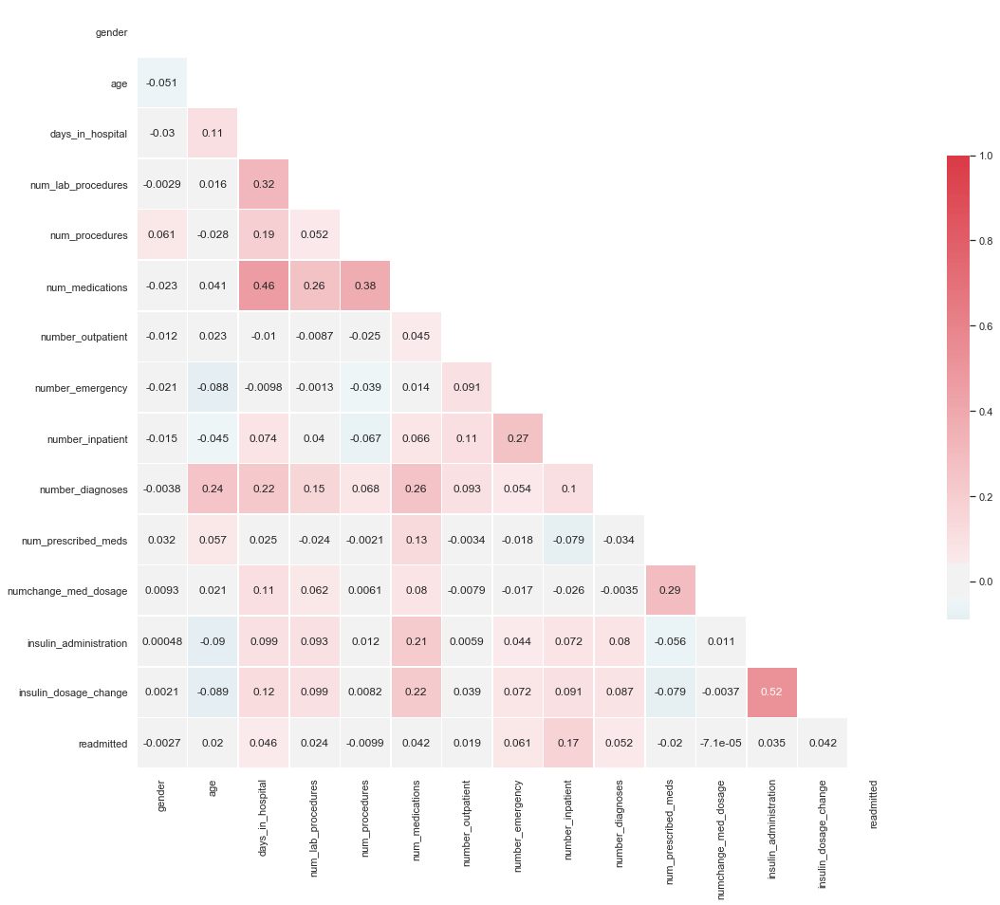

In [17]:
# Copied code from seaborn examples
# https://seaborn.pydata.org/examples/many_pairwise_correlations.html
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(diabetes.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18, 18))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(diabetes.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show();

In [18]:
# Extract the top 4 correlated features for feature engineering 
col = ['days_in_hospital', 'number_emergency', 'number_inpatient', 'number_diagnoses', 'readmitted']
diabetes_mod = diabetes[col]

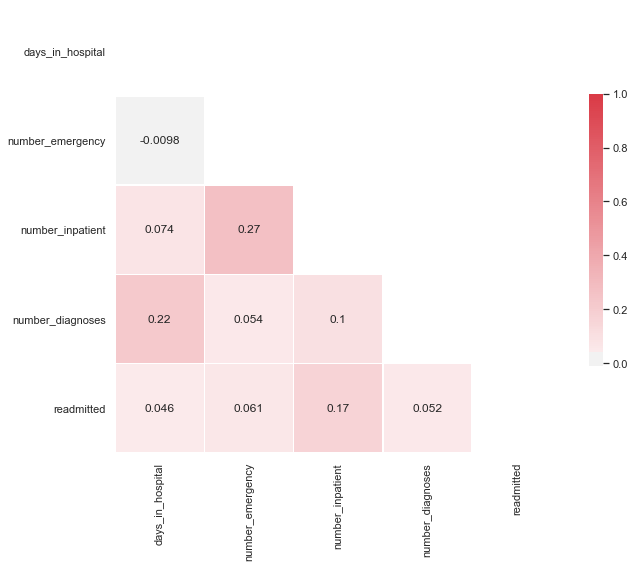

In [19]:
# Copied code from seaborn examples
# https://seaborn.pydata.org/examples/many_pairwise_correlations.html
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(diabetes_mod.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(diabetes_mod.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show();

In [20]:
def col_val_counts(column):
    "Return value counts of each column in diabetes_mod."
    print(diabetes_mod[column].value_counts().sort_index())

In [21]:
for col in diabetes_mod:
    col_val_counts(col)
    print('-' * 50)

1     13555
2     16599
3     17137
4     13460
5      9633
6      7253
7      5608
8      4232
9      2866
10     2239
11     1770
12     1380
13     1152
14      990
Name: days_in_hospital, dtype: int64
--------------------------------------------------
0     86764
1      7477
2      1990
3       710
4       371
5       190
6        93
7        73
8        50
9        33
10       34
11       23
12       10
13       12
14        3
15        3
16        5
18        5
19        4
20        4
21        2
22        6
24        1
25        2
28        1
29        1
37        1
42        1
46        1
54        1
63        1
64        1
76        1
Name: number_emergency, dtype: int64
--------------------------------------------------
0     64877
1     18868
2      7288
3      3285
4      1574
5       795
6       477
7       264
8       145
9       111
10       59
11       49
12       34
13       18
14       10
15        9
16        6
17        1
18        1
19        2
21        1
Name: nu

- observe the values count and distribution in the top four correlated features. 

### days_in_hospital columns

In [22]:
col = ['days_in_hospital', 'number_emergency', 'number_inpatient', 'number_diagnoses', 'readmitted']
diabetes_mod = diabetes[col]

for i in diabetes.days_in_hospital.unique():
    diabetes_mod['{}_days_in_hospital'.format(i)] = diabetes['days_in_hospital'].apply(lambda x: 1 if x == i else 0)
    
    if diabetes_mod['{}_days_in_hospital'.format(i)].corr(diabetes_mod['readmitted']) > diabetes_mod['days_in_hospital'].corr(diabetes_mod['readmitted']):
        print('{}_days_in_hospital'.format(i))
    else:
        pass
print('Search End')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Search End


### number_emergency columns

In [23]:
col = ['days_in_hospital', 'number_emergency', 'number_inpatient', 'number_diagnoses', 'readmitted']
diabetes_mod = diabetes[col]

for i in diabetes.number_emergency.unique():
    diabetes_mod['{}_num_emergency'.format(i)] = diabetes['number_emergency'].apply(lambda x: 1 if x == i else 0)
    
    if diabetes_mod['{}_num_emergency'.format(i)].corr(diabetes_mod['readmitted']) > diabetes['number_emergency'].corr(diabetes_mod['readmitted']):
        print('{}_num_emergency'.format(i))
    else:
        pass
print('Search End')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Search End


### number_inpatient columns

In [24]:
col = ['days_in_hospital', 'number_emergency', 'number_inpatient', 'number_diagnoses', 'readmitted']
diabetes_mod = diabetes[col]

for i in diabetes.number_inpatient.unique():
    diabetes_mod['{}_num_inpatient'.format(i)] = diabetes['number_inpatient'].apply(lambda x: 1 if x == i else 0)
    
    if diabetes_mod['{}_num_inpatient'.format(i)].corr(diabetes_mod['readmitted']) > diabetes['number_inpatient'].corr(diabetes_mod['readmitted']):
        print('{}_num_inpatient'.format(i))
    else:
        pass
print('Search End')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Search End


### number_diagnoses columns

In [25]:
col = ['days_in_hospital', 'number_emergency', 'number_inpatient', 'number_diagnoses', 'readmitted']
diabetes_mod = diabetes[col]

for i in diabetes.number_inpatient.unique():
    diabetes_mod['{}_num_diagnoses'.format(i)] = diabetes['number_diagnoses'].apply(lambda x: 1 if x == i else 0)
    
    if diabetes_mod['{}_num_diagnoses'.format(i)].corr(diabetes_mod['readmitted']) > diabetes['number_diagnoses'].corr(diabetes_mod['readmitted']):
        print('{}_num_diagnoses'.format(i))
    else:
        pass
print('Search End')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Search End


- None of the new columns improve the correlation with target column 'readmitted' and is therefore not added. 

### Hospital Visits Ratio: 

In [26]:
diabetes_copy = diabetes.copy()

In [27]:
diabetes_copy['total_visits'] = (diabetes_copy.number_outpatient + diabetes_copy.number_emergency + diabetes.number_inpatient)
diabetes_copy['inpatient_ratio'] = diabetes_copy.number_inpatient/diabetes_copy['total_visits']
diabetes_copy['outpatient_ratio'] = diabetes_copy.number_outpatient/diabetes_copy['total_visits']
diabetes_copy['emergency_ratio'] = diabetes_copy.number_emergency/diabetes_copy['total_visits']

# Rearrange the columns so that the outcome variable column 'readmitted' is at the end
diabetes_copy = diabetes_copy.drop(columns=['readmitted']).assign(readmitted=diabetes_copy['readmitted'])
diabetes_copy = diabetes_copy.fillna(0)

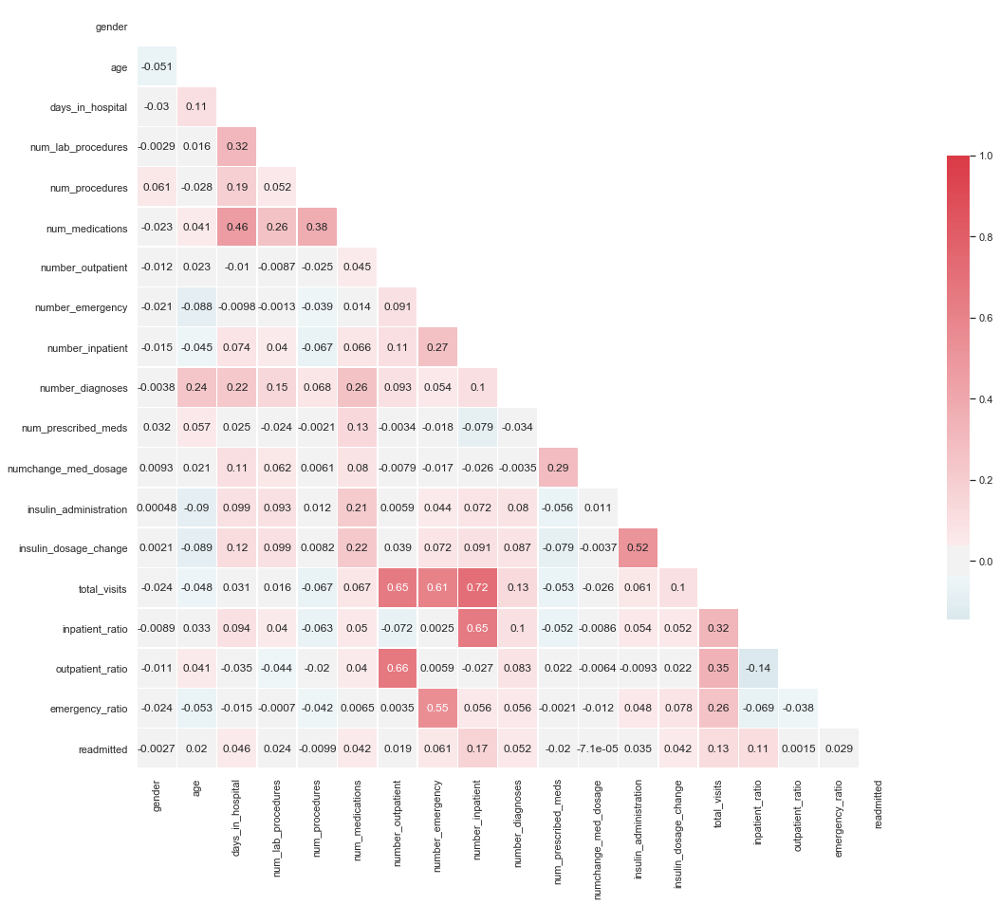

In [28]:
# Copied code from seaborn examples
# https://seaborn.pydata.org/examples/many_pairwise_correlations.html
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(diabetes_copy.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18, 18))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(diabetes_copy.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show();

- New column 'total visits' show improved correaltion with target column, will be added as new feature. 
- Despite having high correlation, 'inpatient_ratio' does not show higher correlation than the exisiting number_inpatient column, thus will not be used. 

# Final DataFrame

In [29]:
diabetes['total_visits'] = (diabetes.number_outpatient + diabetes.number_emergency + diabetes.number_inpatient)

In [30]:
diabetes.columns

Index(['gender', 'age', 'days_in_hospital', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'number_diagnoses',
       'num_prescribed_meds', 'numchange_med_dosage', 'insulin_administration',
       'insulin_dosage_change', 'readmitted', 'total_visits'],
      dtype='object')

In [31]:
# Rearrange columns order
diabetes = diabetes[['gender', 'age', 'days_in_hospital', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'total_visits', 
       'number_diagnoses', 'num_prescribed_meds', 'numchange_med_dosage', 
       'insulin_administration', 'insulin_dosage_change', 'readmitted']]

In [32]:
diabetes

,gender,age,days_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,total_visits,number_diagnoses,num_prescribed_meds,numchange_med_dosage,insulin_administration,insulin_dosage_change,readmitted
0,0,0,1,41,0,1,0,0,0,0,1,0,0,0,0,0
1,0,10,3,59,0,18,0,0,0,0,9,0,0,1,1,0
2,0,20,2,11,5,13,2,0,1,3,6,1,0,0,0,0
3,1,30,2,44,1,16,0,0,0,0,7,0,0,1,1,0
4,1,40,1,51,0,8,0,0,0,0,5,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,1,70,3,51,0,16,0,0,0,0,9,1,0,1,1,0
101762,0,80,5,33,3,18,0,0,1,1,9,0,0,1,0,0
101763,1,70,1,53,0,9,1,0,0,1,13,1,0,1,1,0
101764,0,80,10,45,2,21,0,0,1,1,9,2,0,1,1,0


## Set Target and Feature Variables 

In [33]:
target_col = 'readmitted'
feature_cols = [c for c in diabetes if c != target_col]

In [34]:
X = diabetes[feature_cols]
y = diabetes[target_col]

In [35]:
X.shape

(97874, 15)

## Create Train, Test, Validation Sets 

In [36]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # 20% Test 
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42) # 0.8*0.25=0.2 Val Set

In [37]:
X_train.shape, y_train.shape

((58724, 15), (58724,))

In [38]:
X_test.shape, y_test.shape

((19575, 15), (19575,))

In [39]:
X_val.shape, y_val.shape

((19575, 15), (19575,))

- Train Set 60%
- Test Set 20% 
- Val Set 20%

## Machine Learning - Initial Attempt

In [40]:
diabetes.readmitted.value_counts(normalize=True)

0   0.886
1   0.114
Name: readmitted, dtype: float64

In [41]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import f1_score

In [42]:
def show_summary_report(actual, prediction):

    if isinstance(actual, pd.Series):
        actual = actual.values.astype(int)
    prediction = prediction.astype(int)

    print('Accuracy : %.4f [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0' % accuracy_score(actual, prediction))
    print('Precision: %.4f [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0' % precision_score(actual, prediction))
    print('Recall   : %.4f [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0' % recall_score(actual, prediction))
    print('f1 Score : %.4f [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0' % f1_score(actual, prediction))
    print('ROC AUC  : %.4f                                                                     Best: 1, Worst: < 0.5' % roc_auc_score(actual, prediction))
    print('-' * 107)
    print('TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples')

    # Confusion Matrix
    mat = confusion_matrix(actual, prediction)

    # Precision/Recall
    precision, recall, _ = precision_recall_curve(actual, prediction)
    average_precision = average_precision_score(actual, prediction)
    
    # Compute ROC curve and ROC area
    fpr, tpr, _ = roc_curve(actual, prediction)
    roc_auc = auc(fpr, tpr)


    # plot
    fig, ax = plt.subplots(1, 3, figsize = (18, 6))
    fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

    # Confusion Matrix
    sns.heatmap(mat.T, square = True, annot = True, annot_kws={"size": 25}, fmt = 'd', cbar = False, cmap = 'Blues', ax = ax[0], linewidths=0.9, linecolor='black')

    ax[0].set_title('Confusion Matrix', fontsize = 20)
    ax[0].set_xlabel('True label', fontsize = 18)
    ax[0].set_ylabel('Predicted label', fontsize = 18)
    ax[0].set_xticklabels(labels=[0,1], fontsize = 15)
    ax[0].set_yticklabels(labels=[0,1], fontsize = 15)
    
    # Precision/Recall
    step_kwargs = {'step': 'post'}
    ax[1].step(recall, precision, color = 'b', alpha = 0.2, where = 'post')
    ax[1].fill_between(recall, precision, alpha = 0.2, color = 'b', **step_kwargs)
    ax[1].set_ylim([0.0, 1.0])
    ax[1].set_xlim([0.0, 1.0])
    ax[1].set_xlabel('Recall', fontsize = 18)
    ax[1].set_ylabel('Precision', fontsize = 18)
    ax[1].set_title('2-class Precision-Recall curve', fontsize = 20)
    ax[1].set_xticklabels(labels=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize = 15)
    ax[1].set_yticklabels(labels=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize = 15)

    # ROC
    ax[2].plot(fpr, tpr, color = 'darkorange', lw = 2, label = 'ROC curve (AUC = %0.2f)' % roc_auc)
    ax[2].plot([0, 1], [0, 1], color = 'navy', lw = 2, linestyle = '--')
    ax[2].set_xlim([0.0, 1.0])
    ax[2].set_ylim([0.0, 1.0])
    ax[2].set_xlabel('False Positive Rate', fontsize = 18)
    ax[2].set_ylabel('True Positive Rate', fontsize = 18)
    ax[2].set_title('Receiver Operating Characteristic', fontsize = 20)
    ax[2].set_xticklabels(labels=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize = 15)
    ax[2].set_yticklabels(labels=[0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize = 15)
    ax[2].legend(loc = 'lower right')

    plt.show()


In [43]:
# Logistic Regression 
from sklearn.linear_model import LogisticRegression 

lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)

lr_pred_train = lr.predict(X_train)
lr_pred_test = lr.predict(X_test)

Accuracy : 0.8868 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.4718 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.0139 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.0269 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5059                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


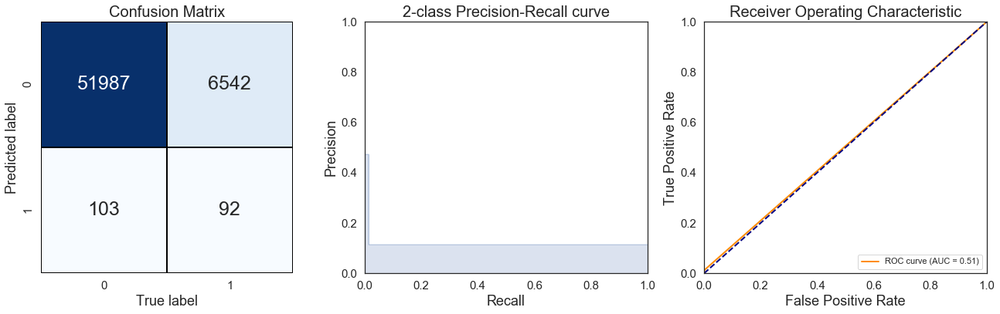

In [44]:
show_summary_report(y_train, lr_pred_train)

Accuracy : 0.8855 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6071 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.0151 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.0294 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5069                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


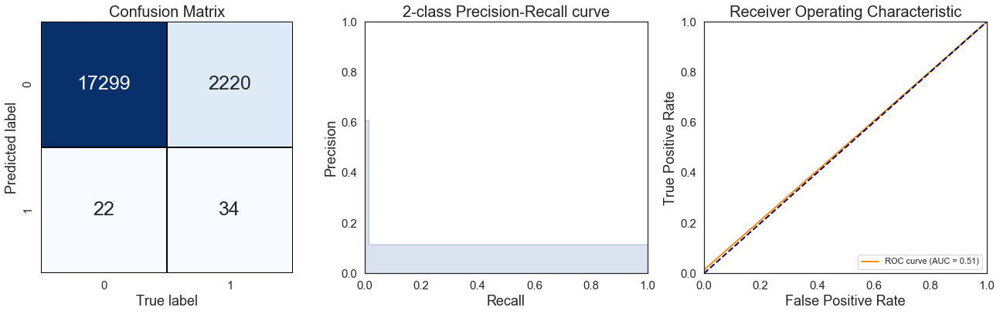

In [45]:
show_summary_report(y_test, lr_pred_test)

- High Accuracy due to imbalanced data. 
- This model predicts most of the outcome as 0, unable to predict 1. 

## Resample Data for Imbalanced Data

SMOTETomek method is chosen to prevent overfitting due to noises created from upsampling the minority class. 
SMOTETomek will be applied to the training subset to prevent modification of the test subset, which can affect the real-world problem that results in over-optimisitc outcome. 

In [46]:
# Over sampling followed by under sampling 
from imblearn.combine import SMOTETomek

smt = SMOTETomek(random_state=42)

X_train, y_train = smt.fit_resample(X_train, y_train)

In [47]:
# Logistic Regression - Same model 
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)

lr_pred_train = lr.predict(X_train)
lr_pred_test = lr.predict(X_test)

Accuracy : 0.6898 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6986 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.6676 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6827 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6898                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


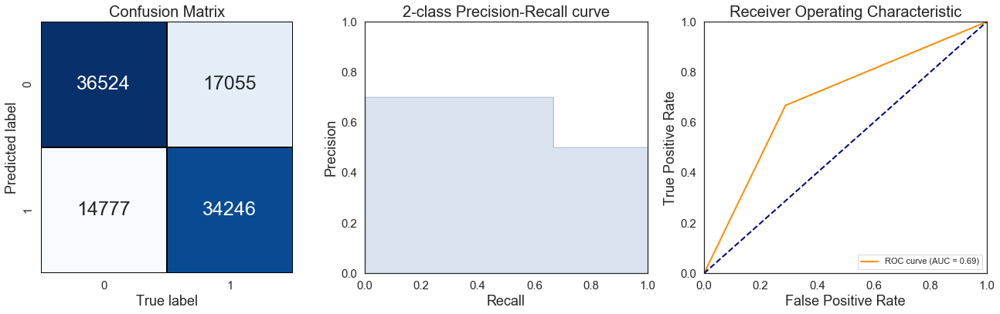

In [48]:
show_summary_report(y_train, lr_pred_train)

Accuracy : 0.6693 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1303 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.3301 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.1869 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5217                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


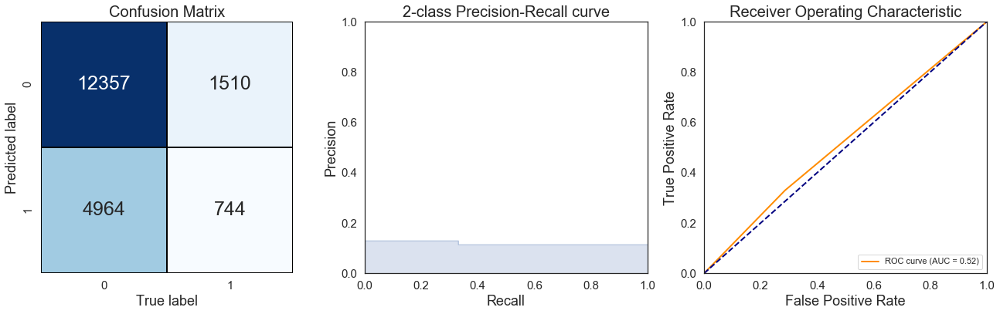

In [49]:
show_summary_report(y_test, lr_pred_test)

- After resampling, the training set is now getting acceptable result
- Test and val sets cannot be resampled as it will alter the real-world problem.
- Require feature selection and hyperparameter tuning to improve performance metrics

## Feature Selection

3 feature selection methods will be attempted in distinguish the best selection technique.
- Correlation heatmap
- SelectKBest with chi2 score
- Recursive feature elimination
2 modelling algorithms: logistic regression and decision trees will be used to determine the best technique. 

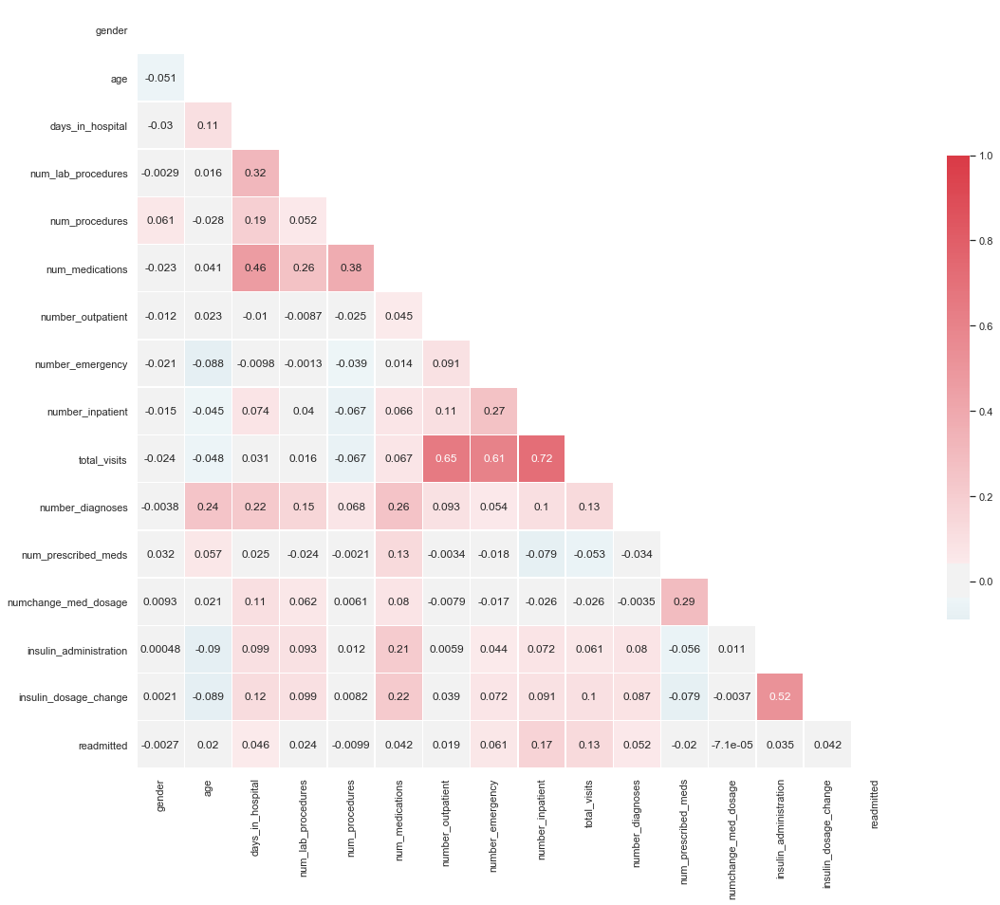

In [50]:
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(diabetes.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(18, 18))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(diabetes.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show();

In [51]:
# Based on Correlation Heatmap
all_vars = X_train.columns.tolist()
manual_col = ['days_in_hospital', 'number_emergency', 'number_inpatient', 'total_visits', 'number_diagnoses']
drop_col = [c for c in all_vars if c not in manual_col]

In [52]:
# Drop less important variables
X_train_manual = X_train.drop(drop_col, axis=1)
X_test_manual = X_test.drop(drop_col, axis=1)
X_val_manual = X_val.drop(drop_col, axis=1)

In [53]:
# Logistic Regression - Same model 
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train_manual, y_train)

lr_pred_train_manual = lr.predict(X_train_manual)
lr_pred_test_manual = lr.predict(X_test_manual)

Accuracy : 0.5431 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.5659 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.3705 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.4478 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5431                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


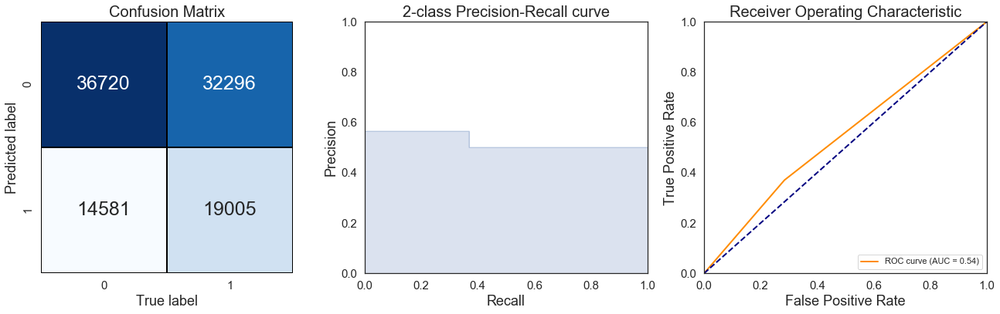

In [54]:
show_summary_report(y_train, lr_pred_train_manual)

Accuracy : 0.6879 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1724 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4503 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2494 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5845                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


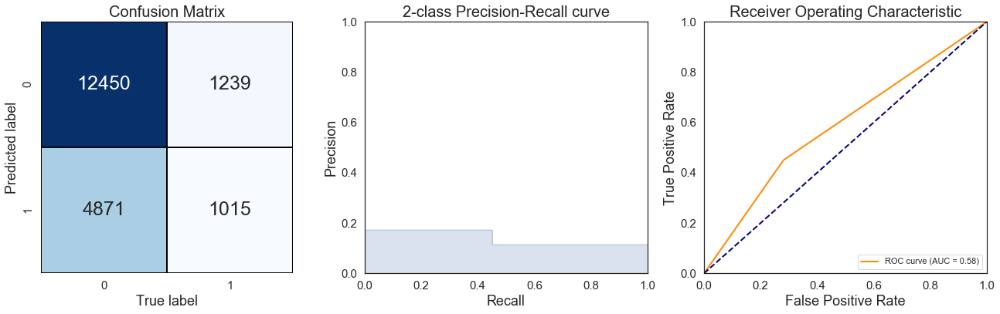

In [55]:
show_summary_report(y_test, lr_pred_test_manual)

In [56]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(X_train_manual, y_train)

dt_pred_train_manual = dt.predict(X_train_manual)
dt_pred_test_manual = dt.predict(X_test_manual)

Accuracy : 0.6257 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6707 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4941 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.5690 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6257                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


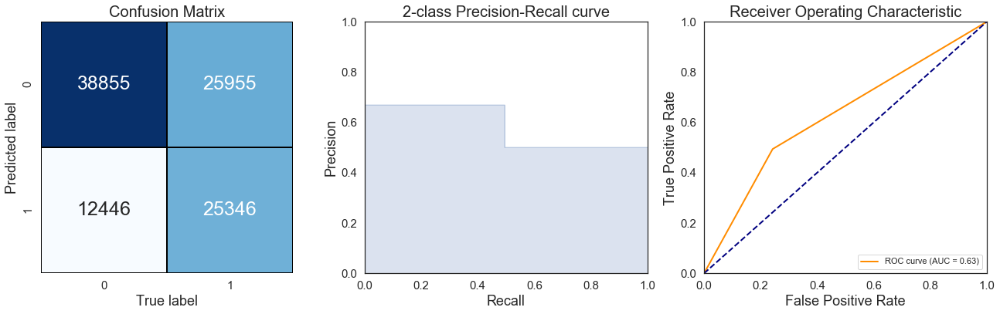

In [57]:
show_summary_report(y_train, dt_pred_train_manual)

Accuracy : 0.6792 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1397 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.3461 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.1990 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5343                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


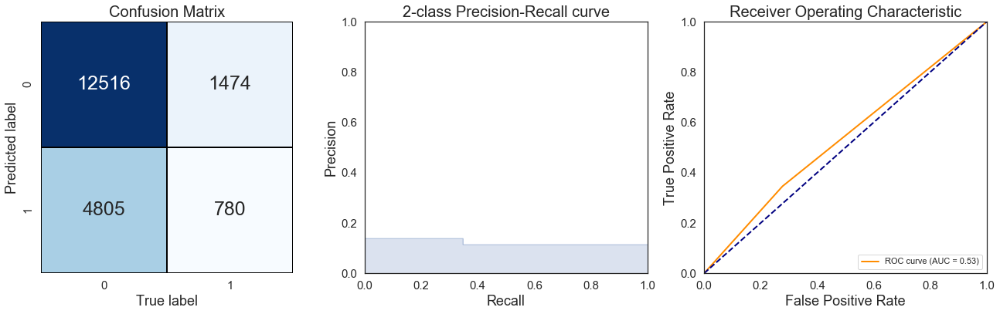

In [58]:
show_summary_report(y_test, dt_pred_test_manual)

- With manual selection, the train set did not perform as well as the model without feature selection.
- Less overfitting than without feature selection 
- Test Set overall performance metrics improved

In [59]:
# SelectKBest, Chi2
from sklearn.feature_selection import SelectKBest, chi2

kbest = SelectKBest(chi2)
kbest.fit(X_train, y_train)

SelectKBest(score_func=<function chi2 at 0x1a1c99b710>)

In [60]:
kbest_feat_imp = pd.DataFrame({'Feature': X_train.columns, 'Chi2 Score': kbest.scores_})
kbest_feat_imp

,Feature,Chi2 Score
0,gender,2777.234
1,age,463.876
2,days_in_hospital,1.238
3,num_lab_procedures,1023.646
4,num_procedures,2871.273
5,num_medications,788.755
6,number_outpatient,773.825
7,number_emergency,260.901
8,number_inpatient,4320.839
9,total_visits,4403.905


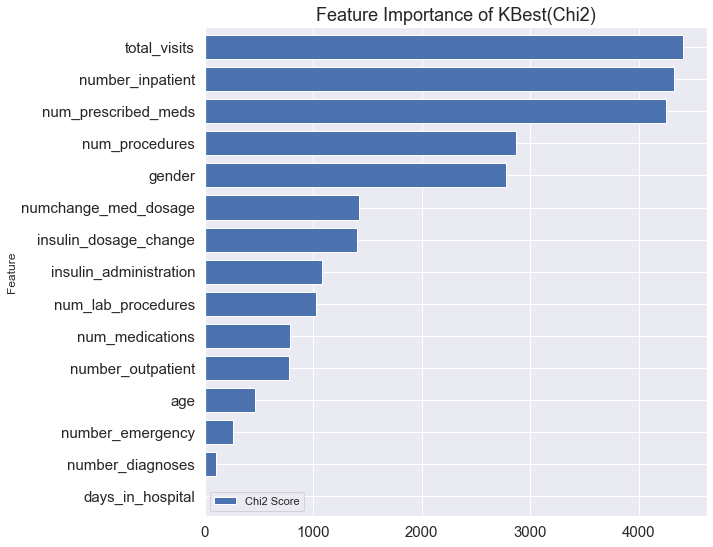

In [136]:
kbest_feat_imp.sort_values('Chi2 Score',inplace=True)
kbest_feat_imp.plot(kind='barh',y='Chi2 Score',x='Feature', figsize=(9,9), width=0.75, fontsize=15);
plt.title('Feature Importance of KBest(Chi2)', fontsize=18);

- Select the top 5 features (score>2000)

In [62]:
# Based on SelectKBest 
kbest_col = ['total_visits', 'number_inpatient', 'num_prescribed_meds', 'num_procedures', 'gender']
drop_col = [c for c in all_vars if c not in kbest_col]

In [63]:
# Drop less important variables
X_train_kbest = X_train.drop(drop_col, axis=1)
X_test_kbest = X_test.drop(drop_col, axis=1)
X_val_kbest = X_val.drop(drop_col, axis=1)

In [64]:
# Logistic Regression - Same model 
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train_kbest, y_train)

lr_pred_train_kbest = lr.predict(X_train_kbest)
lr_pred_test_kbest = lr.predict(X_test_kbest)

Accuracy : 0.6290 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6234 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.6515 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6371 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6290                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


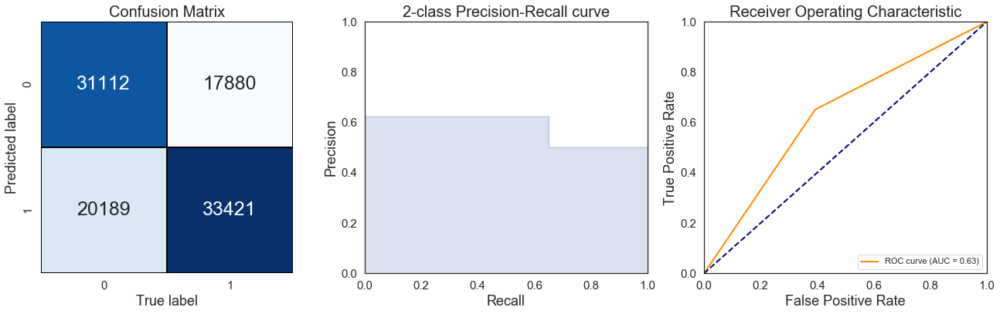

In [65]:
show_summary_report(y_train, lr_pred_train_kbest)

Accuracy : 0.5929 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1342 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4650 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2082 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5373                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


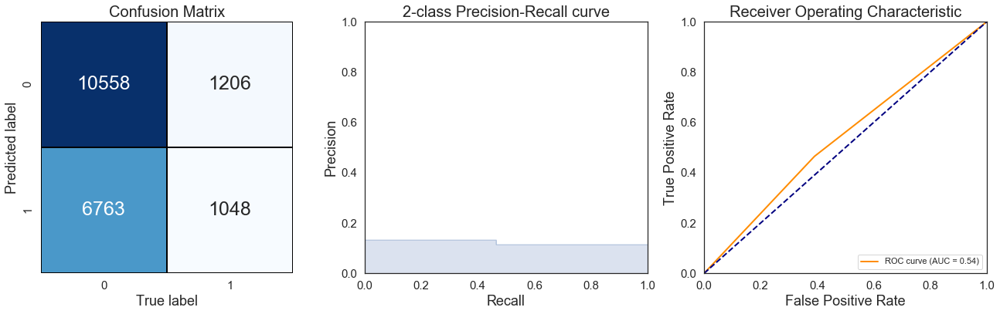

In [66]:
show_summary_report(y_test, lr_pred_test_kbest)

In [67]:
dt = DecisionTreeClassifier()
dt.fit(X_train_kbest, y_train)

dt_pred_train_kbest = dt.predict(X_train_kbest)
dt_pred_test_kbest = dt.predict(X_test_kbest)

Accuracy : 0.6458 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6293 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.7094 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6670 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6458                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


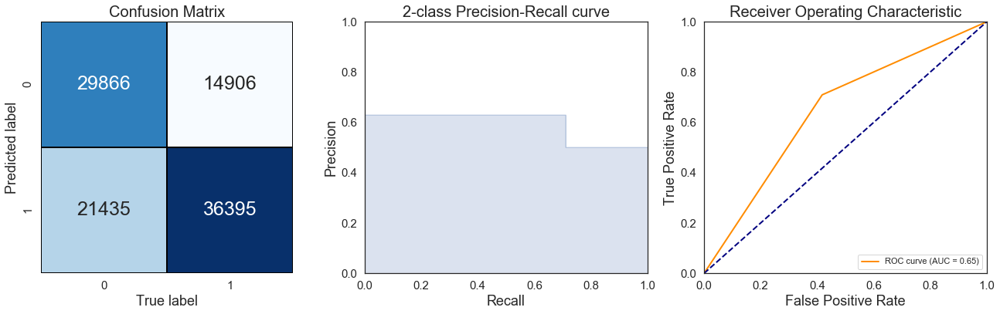

In [68]:
show_summary_report(y_train, dt_pred_train_kbest)

Accuracy : 0.5621 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1291 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4880 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2042 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5299                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


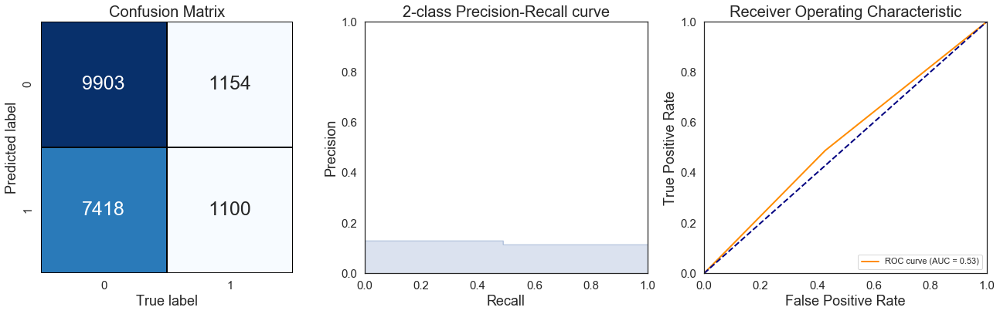

In [69]:
show_summary_report(y_test, dt_pred_test_kbest)

In [70]:
# Recursive Feature Elimination
from sklearn.feature_selection import RFE

log_reg = LogisticRegression(max_iter=1000)
rfe = RFE(estimator=log_reg, n_features_to_select=5)
rfe.fit(X_train, y_train)

RFE(estimator=LogisticRegression(max_iter=1000), n_features_to_select=5)

In [71]:
# Print Score - Reduce X to the selected features and then return the score of the underlying estimator
rfe.score(X_train, y_train)
# Find Features
rfe.support_
rfe.ranking_

d = {'Features': X_train.columns, 'Selected': rfe.support_, 'Ranking': rfe.ranking_}
rfe_feat_imp = pd.DataFrame({'Features': X_train.columns, 'Selected': rfe.support_, 'Ranking': rfe.ranking_})
rfe_feat_imp

,Features,Selected,Ranking
0,gender,False,2
1,age,False,10
2,days_in_hospital,False,9
3,num_lab_procedures,False,11
4,num_procedures,False,6
5,num_medications,False,7
6,number_outpatient,True,1
7,number_emergency,True,1
8,number_inpatient,True,1
9,total_visits,True,1


In [72]:
rfe_col = ['number_outpatient', 'number_emergency', 'number_inpatient', 'total_visits', 'numchange_med_dosage']
drop_col = [c for c in all_vars if c not in rfe_col]

In [73]:
# Drop less important variables
X_train_rfe = X_train.drop(drop_col, axis=1)
X_test_rfe = X_test.drop(drop_col, axis=1)
X_val_rfe = X_val.drop(drop_col, axis=1)

In [74]:
# Logistic Regression - Same model 
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train_rfe, y_train)

lr_pred_train_rfe = lr.predict(X_train_rfe)
lr_pred_test_rfe = lr.predict(X_test_rfe)

Accuracy : 0.5989 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7591 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.2897 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.4194 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5989                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


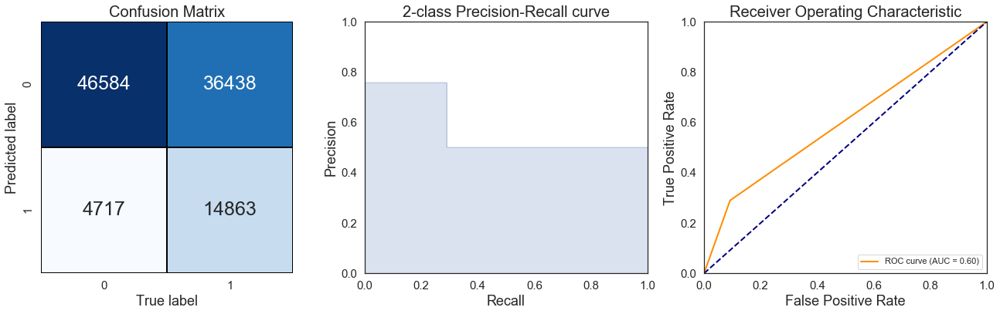

In [75]:
show_summary_report(y_train, lr_pred_train_rfe)

Accuracy : 0.8276 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.2305 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.2125 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2211 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5601                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


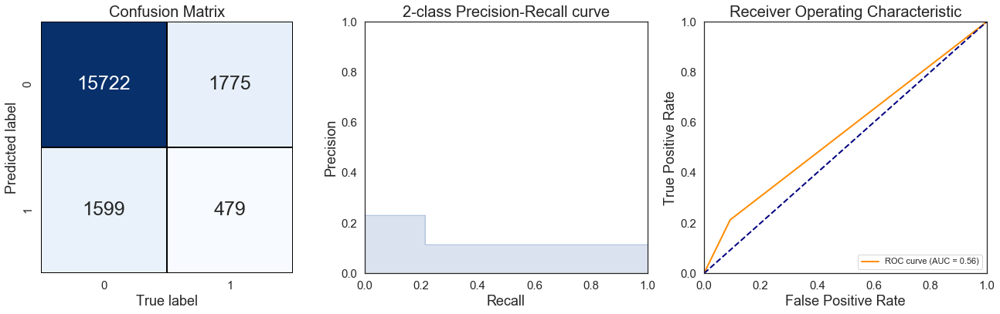

In [76]:
show_summary_report(y_test, lr_pred_test_rfe)

In [77]:
dt = DecisionTreeClassifier()
dt.fit(X_train_rfe, y_train)

dt_pred_train_rfe = dt.predict(X_train_rfe)
dt_pred_test_rfe = dt.predict(X_test_rfe)

Accuracy : 0.6044 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7858 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.2871 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.4205 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6044                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


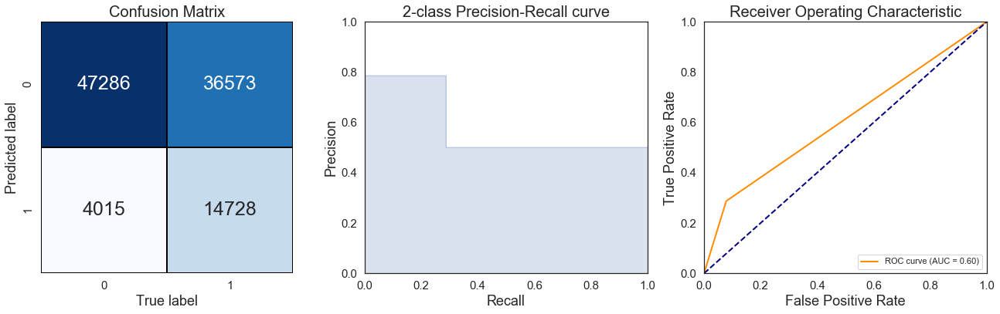

In [78]:
show_summary_report(y_train, dt_pred_train_rfe)

Accuracy : 0.8312 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.2221 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.1863 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2027 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5507                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


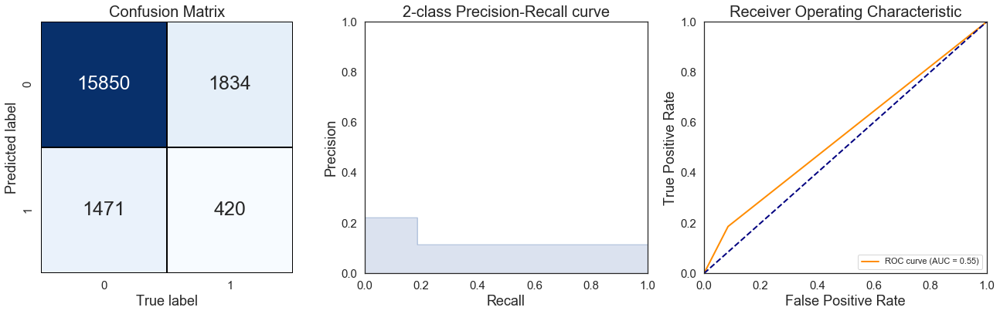

In [79]:
show_summary_report(y_test, dt_pred_test_rfe)

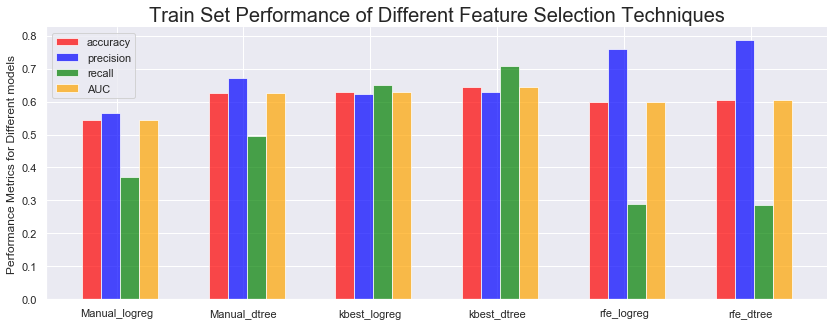

In [128]:
# plotting the performance matrics for train sets models 
plt.figure(figsize=(14, 5))
ax = plt.subplot(111)

models = ['Manual_logreg', 'Manual_dtree', 'kbest_logreg', 'kbest_dtree', 'rfe_logreg', 'rfe_dtree']
model = np.arange(len(models))

values = [accuracy_score(y_train, lr_pred_train_manual), accuracy_score(y_train, dt_pred_train_manual), accuracy_score(y_train, lr_pred_train_kbest), accuracy_score(y_train, dt_pred_train_kbest), accuracy_score(y_train, lr_pred_train_rfe), accuracy_score(y_train, dt_pred_train_rfe)]
plt.bar(model, values, align='center', width = 0.15, alpha=0.7, color = 'red', label= 'accuracy')


values = [precision_score(y_train, lr_pred_train_manual), precision_score(y_train, dt_pred_train_manual), precision_score(y_train, lr_pred_train_kbest), precision_score(y_train, dt_pred_train_kbest), precision_score(y_train, lr_pred_train_rfe), precision_score(y_train, dt_pred_train_rfe)]
plt.bar(model+0.15, values, align='center', width = 0.15, alpha=0.7, color = 'blue', label = 'precision')


values = [recall_score(y_train, lr_pred_train_manual), recall_score(y_train, dt_pred_train_manual), recall_score(y_train, lr_pred_train_kbest), recall_score(y_train, dt_pred_train_kbest), recall_score(y_train, lr_pred_train_rfe), recall_score(y_train, dt_pred_train_rfe)]
plt.bar(model+0.3, values, align='center', width = 0.15, alpha=0.7, color = 'green', label = 'recall')


values = [roc_auc_score(y_train, lr_pred_train_manual), roc_auc_score(y_train, dt_pred_train_manual), roc_auc_score(y_train, lr_pred_train_kbest), roc_auc_score(y_train, dt_pred_train_kbest), roc_auc_score(y_train, lr_pred_train_rfe), roc_auc_score(y_train, dt_pred_train_rfe)]
plt.bar(model+0.45, values, align='center', width = 0.15, alpha=0.7, color = 'orange', label = 'AUC')


plt.xticks(model+0.2, models)
plt.ylabel('Performance Metrics for Different models')
plt.title('Train Set Performance of Different Feature Selection Techniques', fontsize=20)
    
# removing the axis on the top and right of the plot window
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend()

plt.show()


- The plot shows that for train set, kbest feature selection performs the best in both models (logreg and dtree)
- kbest selection technique shows similar score for the four performance metrics.

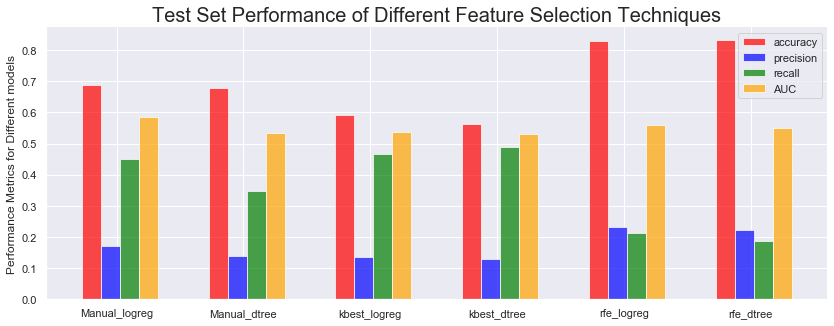

In [129]:
# plotting the performance matrics for test sets models 
plt.figure(figsize=(14, 5))
ax = plt.subplot(111)

models = ['Manual_logreg', 'Manual_dtree', 'kbest_logreg', 'kbest_dtree', 'rfe_logreg', 'rfe_dtree']
model = np.arange(len(models))

values = [accuracy_score(y_test, lr_pred_test_manual), accuracy_score(y_test, dt_pred_test_manual), accuracy_score(y_test, lr_pred_test_kbest), accuracy_score(y_test, dt_pred_test_kbest), accuracy_score(y_test, lr_pred_test_rfe), accuracy_score(y_test, dt_pred_test_rfe)]
plt.bar(model, values, align='center', width = 0.15, alpha=0.7, color = 'red', label= 'accuracy')


values = [precision_score(y_test, lr_pred_test_manual), precision_score(y_test, dt_pred_test_manual), precision_score(y_test, lr_pred_test_kbest), precision_score(y_test, dt_pred_test_kbest), precision_score(y_test, lr_pred_test_rfe), precision_score(y_test, dt_pred_test_rfe)]
plt.bar(model+0.15, values, align='center', width = 0.15, alpha=0.7, color = 'blue', label = 'precision')


values = [recall_score(y_test, lr_pred_test_manual), recall_score(y_test, dt_pred_test_manual), recall_score(y_test, lr_pred_test_kbest), recall_score(y_test, dt_pred_test_kbest), recall_score(y_test, lr_pred_test_rfe), recall_score(y_test, dt_pred_test_rfe)]
plt.bar(model+0.3, values, align='center', width = 0.15, alpha=0.7, color = 'green', label = 'recall')


values = [roc_auc_score(y_test, lr_pred_test_manual), roc_auc_score(y_test, dt_pred_test_manual), roc_auc_score(y_test, lr_pred_test_kbest), roc_auc_score(y_test, dt_pred_test_kbest), roc_auc_score(y_test, lr_pred_test_rfe), roc_auc_score(y_test, dt_pred_test_rfe)]
plt.bar(model+0.45, values, align='center', width = 0.15, alpha=0.7, color = 'orange', label = 'AUC')


plt.xticks(model+0.2, models)
plt.ylabel('Performance Metrics for Different models')
plt.title('Test Set Performance of Different Feature Selection Techniques', fontsize=20)
    
# removing the axis on the top and right of the plot window
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend()

plt.show()


- The plot shows that for test set, all three selection techniques have better performance for accuracy and AUC than precision and recall. 
- However, rfe shows significant lower recall compared to the other two techinques.
- Manual selection shows a wider range in the four performance metrics while kbest shows less variability in the performance metrics scores. 
- Overall, kbest has the best performance and is thus chosen for the feature selection technique for modelling.
    - X_train_kbest
    - X_test_kbest
    - X_val_kbest

## Hyperparameter Tuning 

In [82]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from time import time

In [83]:
# Linear Regression 
lr = LogisticRegression()

# Specify parameters and distributions to sample form 
param_dict = {"penalty": ['l1', 'l2'],
              "solver": ['liblinear', 'saga'],
              "max_iter": [100, 250, 500, 1000]}


# Create randomized search 5-fold cross validation and 1000 iterations
n_iter = 1000
lr_cv = RandomizedSearchCV(lr, param_distributions=param_dict,
                               n_iter=n_iter, cv=5, n_jobs=-1)

start = time()
lr_cv.fit(X_train_kbest, y_train)
print("RandomizedSearchCV took %.2f seconds for %d candidates"
      "parameter settings." % ((time() - start), n_iter))
print("Tuned Logistic Regression Parameters: {}".format(lr_cv.best_params_))
print("Best Score is: {}".format(lr_cv.best_score_))

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:282: UserWarning: The total space of parameters 16 is smaller than n_iter=1000. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


RandomizedSearchCV took 7.66 seconds for 1000 candidatesparameter settings.
Tuned Logistic Regression Parameters: {'solver': 'saga', 'penalty': 'l1', 'max_iter': 1000}
Best Score is: 0.6280681226752645


In [84]:
# K Nearest Neighbours 
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()

# Specify parameters and distributions to sample form 
param_dict = {"n_neighbors": [1, 5, 10, 50, 100],
              "weights": ['uniform', 'distance']}


# Create randomized search 5-fold cross validation and 1000 iterations
n_iter = 1000
knn_cv = RandomizedSearchCV(knn, param_distributions=param_dict,
                               n_iter=n_iter, cv=5, n_jobs=-1)

start = time()
knn_cv.fit(X_train_kbest, y_train)
print("RandomizedSearchCV took %.2f seconds for %d candidates"
      "parameter settings." % ((time() - start), n_iter))
print("Tuned KNN Parameters: {}".format(knn_cv.best_params_))
print("Best Score is: {}".format(knn_cv.best_score_))

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:282: UserWarning: The total space of parameters 10 is smaller than n_iter=1000. Running 10 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


RandomizedSearchCV took 146.17 seconds for 1000 candidatesparameter settings.
Tuned KNN Parameters: {'weights': 'uniform', 'n_neighbors': 100}
Best Score is: 0.5903979036166346


In [85]:
# Decision Tree
dt = DecisionTreeClassifier()


# Specify parameters and distributions to sample form 
param_dist = {"max_depth": [3,5,10,None],
              "max_features": randint(1,6),
              "min_samples_leaf": [10,20,30,40,50],
              "class_weight": ["balanced", None],
              "criterion": ["gini", "entropy"]}


# Run randomised search 
n_iter_search = 1000
dt_cv = RandomizedSearchCV(dt, param_distributions=param_dist,
                               n_iter=n_iter_search, n_jobs=-1, cv=5)

start = time()
dt_cv.fit(X_train_kbest, y_train)
print("RandomizedSearchCV took %.2f seconds for %d candidates"
      "parameter settings." % ((time() - start), n_iter_search))
print("Tuned Decision Tree Parameters: {}".format(dt_cv.best_params_))
print("Best Score is: {}".format(dt_cv.best_score_))

RandomizedSearchCV took 123.41 seconds for 1000 candidatesparameter settings.
Tuned Decision Tree Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 2, 'min_samples_leaf': 20}
Best Score is: 0.6345592742773936


## Machine Learning with Tuned Parameters 

### Logistic Regression 

In [86]:
logreg = LogisticRegression(solver='liblinear', penalty='l1', multi_class='auto', max_iter=3000)
logreg.fit(X_train_kbest, y_train)

logreg_pred_train = logreg.predict(X_train_kbest)
logreg_pred_test = logreg.predict(X_test_kbest)

In [87]:
logreg.coef_

array([[-0.82521022, -0.12156236,  0.15321864, -0.00402839, -0.54208694]])

Accuracy : 0.6290 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6234 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.6515 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6371 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6290                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


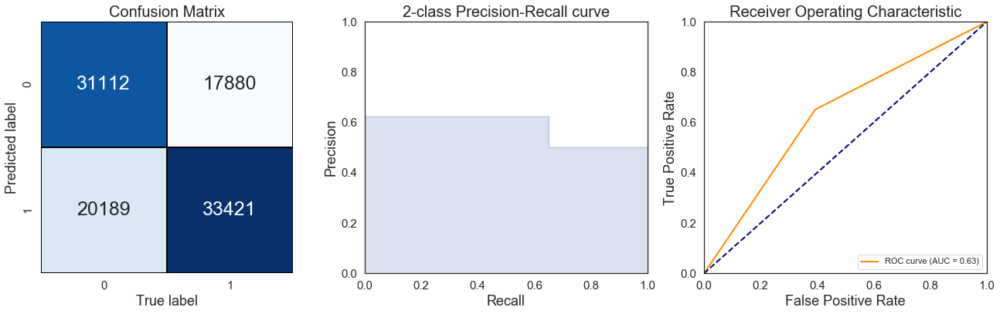

In [88]:
show_summary_report(y_train, logreg_pred_train)

Accuracy : 0.5929 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1342 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4650 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2082 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5373                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


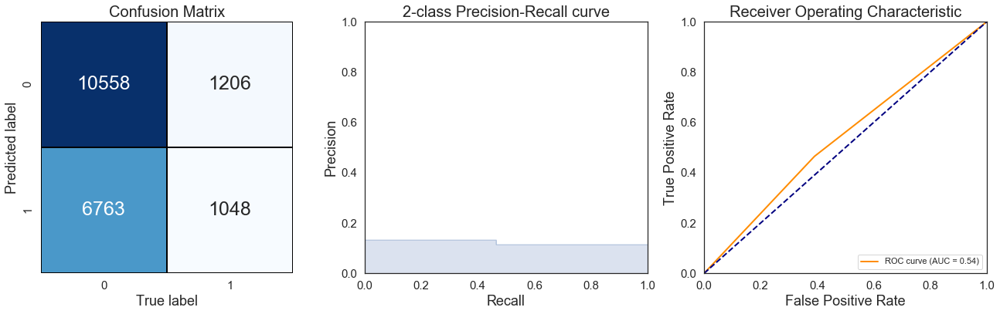

In [89]:
show_summary_report(y_test, logreg_pred_test)

In [90]:
lr_feat_imp = pd.DataFrame(logreg.coef_[0], index=X_train_kbest.columns, columns=['Importance']).sort_values('Importance', ascending=False)

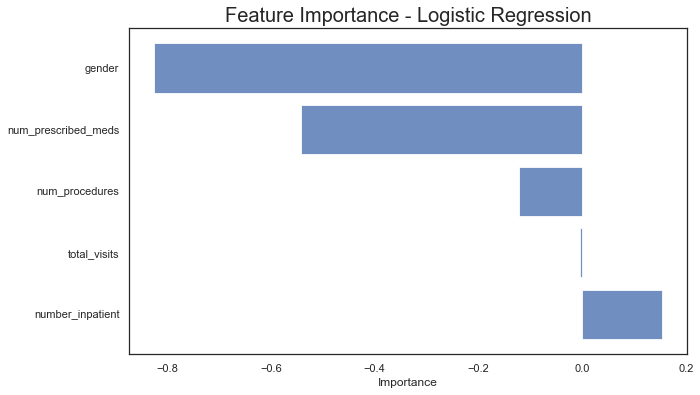

In [91]:
lr_feat_imp.plot(kind='barh', figsize=(10,6), width=0.8, align='center', alpha=0.8, legend=False);

plt.xlabel('Importance')
plt.title('Feature Importance - Logistic Regression', fontsize=20)
plt.show()

### KNN

In [92]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(weights='uniform', n_neighbors=100)
knn.fit(X_train_kbest, y_train)

knn_pred_train = knn.predict(X_train_kbest)
knn_pred_test = knn.predict(X_test_kbest)

Accuracy : 0.5985 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6455 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4371 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.5212 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5985                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


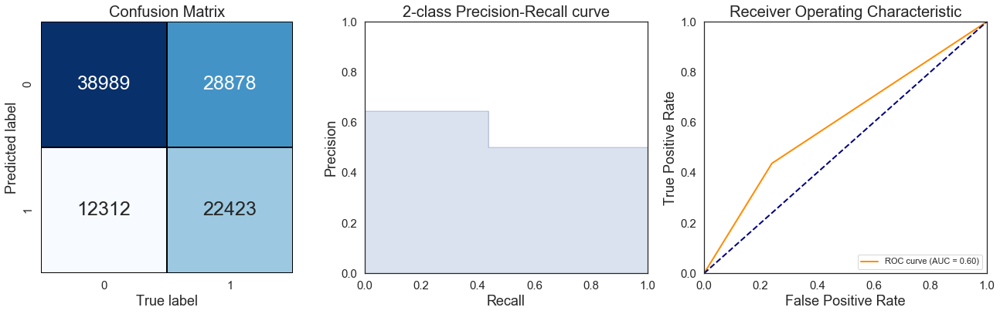

In [93]:
show_summary_report(y_train, knn_pred_train)

Accuracy : 0.7107 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1600 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.3558 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2207 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5563                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


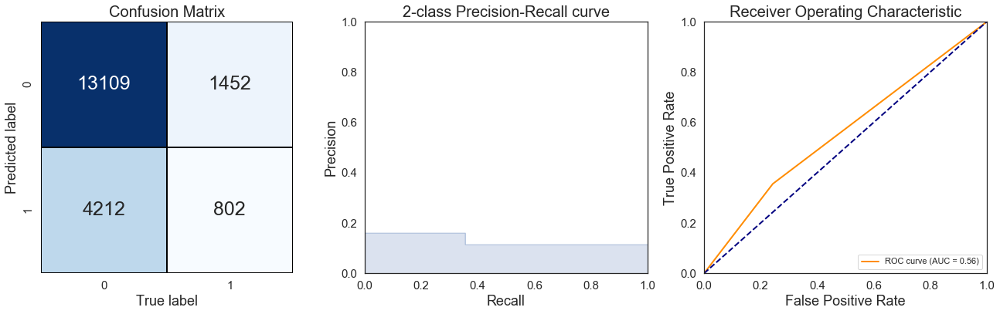

In [94]:
show_summary_report(y_test, knn_pred_test)

### Decision Trees 

In [95]:
dt = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10, max_features=4, min_samples_leaf=30)
dt.fit(X_train_kbest, y_train)

dt_pred_train = dt.predict(X_train_kbest)
dt_pred_test = dt.predict(X_test_kbest)

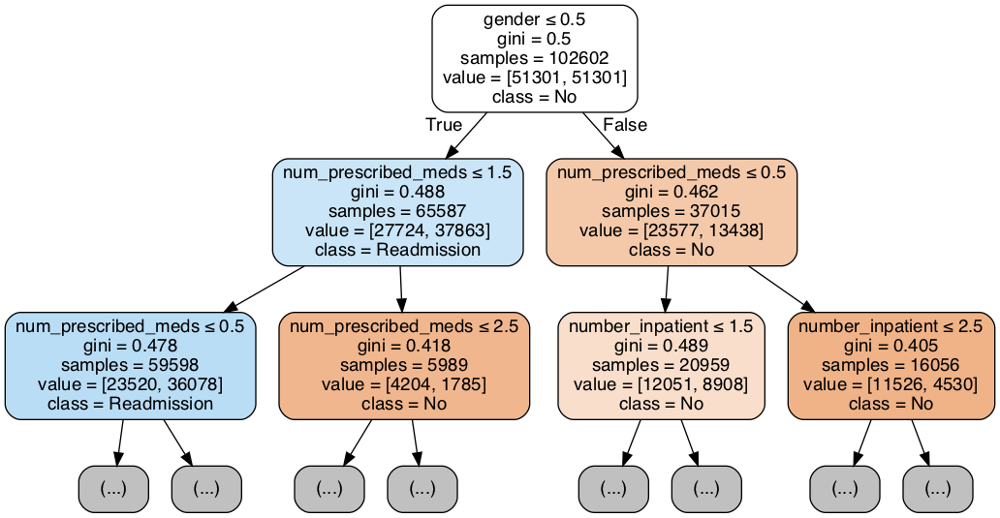

In [96]:
import graphviz
from IPython.display import Image
import pydotplus
from sklearn import tree

dot_dt = tree.export_graphviz(dt, out_file="dt.dot", feature_names=X_train_kbest.columns, max_depth=2, class_names=["No","Readmission"], filled=True, rounded=True, special_characters=True)
graph_dt = pydotplus.graph_from_dot_file('dt.dot')
Image(graph_dt.create_png())

In [97]:
dot_dt = tree.export_graphviz(dt, out_file="dt.dot", feature_names=X_train_kbest.columns, class_names=["No","Readmission"], filled=True, rounded=True, special_characters=True)
graph_dt = pydotplus.graph_from_dot_file('dt.dot')
Image(graph_dt.create_png())

Accuracy : 0.6382 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6207 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.7109 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6627 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6382                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


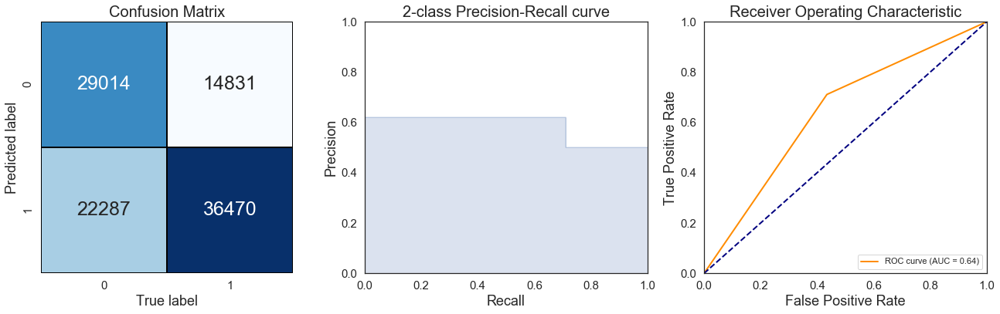

In [98]:
show_summary_report(y_train, dt_pred_train)

Accuracy : 0.5558 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1306 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.5053 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2076 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5338                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


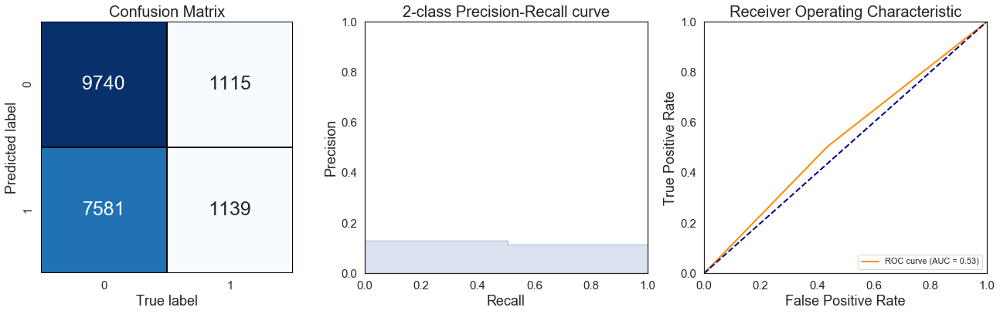

In [99]:
show_summary_report(y_test, dt_pred_test)

In [100]:
feature_numpy = X_train_kbest.columns.to_numpy()
feature_importances = dt.feature_importances_

df = pd.DataFrame([f for f in zip(feature_numpy, feature_importances)], columns=["Feature", "Importance"]).sort_values(by="Importance", ascending=False)
df

,Feature,Importance
0,gender,0.386
4,num_prescribed_meds,0.337
1,num_procedures,0.118
2,number_inpatient,0.103
3,total_visits,0.056


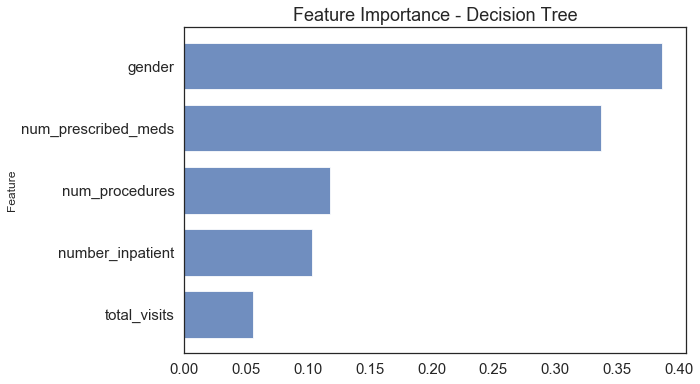

In [101]:
df.sort_values('Importance',inplace=True)
df.plot(kind='barh',y='Importance',x='Feature', figsize=(9,6), width=0.75, fontsize=15, alpha=0.8, legend=False);
plt.title('Feature Importance - Decision Tree', fontsize=18);

### Random Forest

In [102]:
from sklearn.ensemble import RandomForestClassifier

rf = DecisionTreeClassifier(criterion='gini', max_depth=10, max_features=4, min_samples_leaf=30)
rf.fit(X_train_kbest, y_train)

rf_pred_train = rf.predict(X_train_kbest)
rf_pred_test = rf.predict(X_test_kbest)

Accuracy : 0.6381 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6222 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.7034 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6603 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6381                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


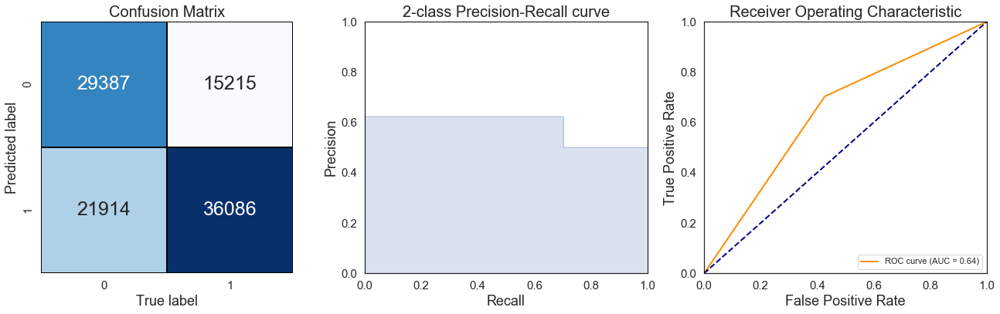

In [103]:
show_summary_report(y_train, rf_pred_train)

Accuracy : 0.5628 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1294 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4880 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2045 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5303                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


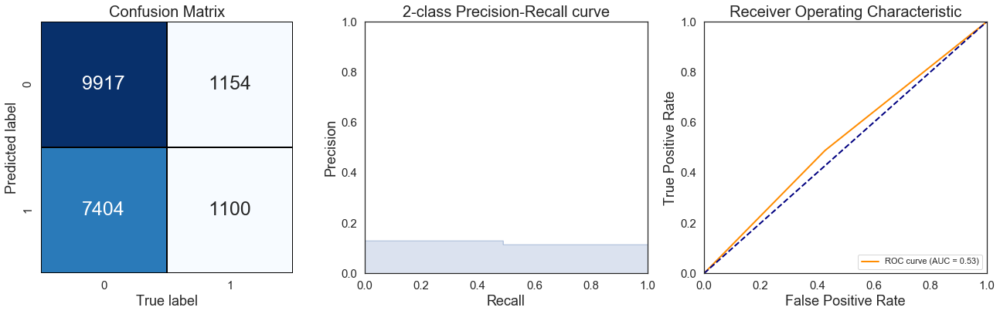

In [104]:
show_summary_report(y_test, rf_pred_test)

In [105]:
rf_feat_imp = pd.DataFrame({'Feature': X_train_kbest.columns, 'Importance': rf.feature_importances_})
rf_feat_imp

,Feature,Importance
0,gender,0.385
1,num_procedures,0.118
2,number_inpatient,0.095
3,total_visits,0.068
4,num_prescribed_meds,0.334


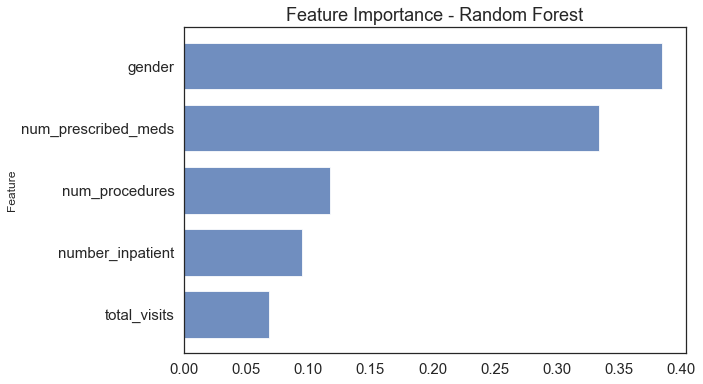

In [106]:
rf_feat_imp.sort_values('Importance',inplace=True)
rf_feat_imp.plot(kind='barh', y='Importance',x='Feature', figsize=(9,6), width=0.75, align='center', alpha=0.8, legend=False, fontsize=15);
plt.title('Feature Importance - Random Forest', fontsize=18)
plt.show()

### Bagging Method

In [107]:
from sklearn.ensemble import BaggingClassifier
bag_clf = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100)
bag_clf.fit(X_train_kbest, y_train)

bag_pred_train = bag_clf.predict(X_train_kbest)
bag_pred_test = bag_clf.predict(X_test_kbest)

Accuracy : 0.6458 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6287 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.7121 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6678 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6458                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


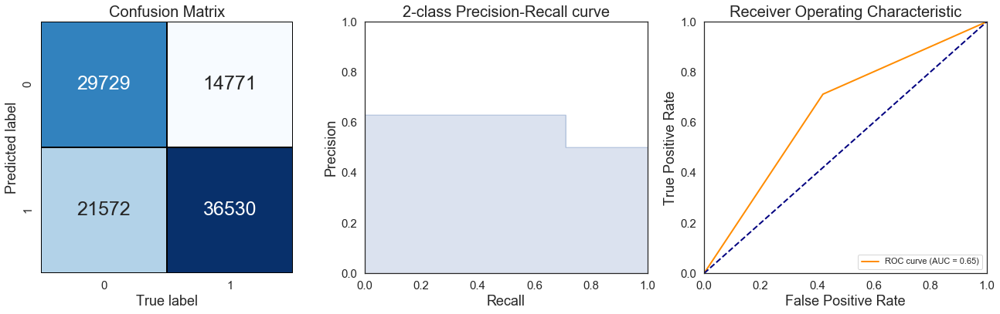

In [108]:
show_summary_report(y_train, bag_pred_train)

Accuracy : 0.5597 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1292 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4920 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2047 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5303                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


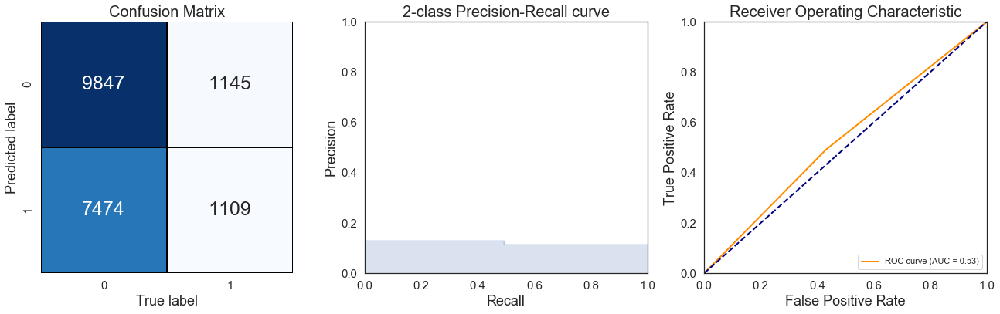

In [109]:
show_summary_report(y_test, bag_pred_test)

### Boosting Method

In [110]:
from sklearn.ensemble import AdaBoostClassifier

boost_clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100)
boost_clf.fit(X_train_kbest, y_train)

boost_pred_train = boost_clf.predict(X_train_kbest)
boost_pred_test = boost_clf.predict(X_test_kbest)

Accuracy : 0.6458 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6280 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.7152 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6688 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6458                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


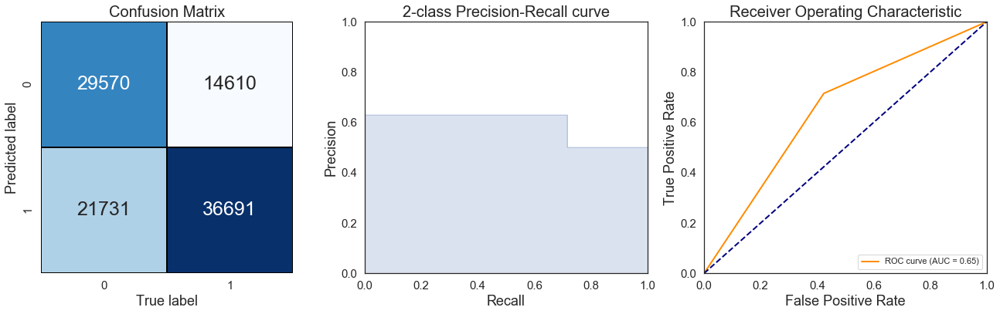

In [111]:
show_summary_report(y_train, boost_pred_train)

Accuracy : 0.5585 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1296 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4960 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2055 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5313                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


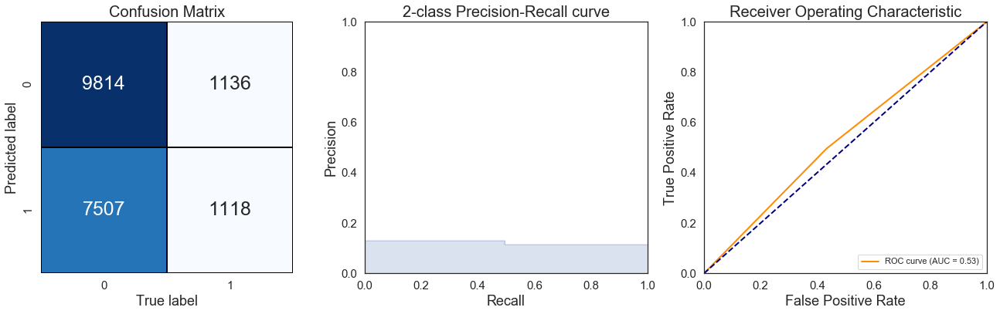

In [112]:
show_summary_report(y_test, boost_pred_test)

### Stacking Method

In [113]:
from sklearn.svm import LinearSVC

# Estimators as a list 
estimators = [('dt',  DecisionTreeClassifier()),
              ('rf',  RandomForestClassifier(n_estimators=20)),
              ('lr',  LogisticRegression(max_iter=3000)),
              ('knn', KNeighborsClassifier())]

In [114]:
from sklearn.ensemble import StackingClassifier
stack_clf = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression(random_state=42))
stack_clf.fit(X_train_kbest, y_train)

stack_pred_train = stack_clf.predict(X_train_kbest)
stack_pred_test = stack_clf.predict(X_test_kbest)

Accuracy : 0.6422 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6296 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.6907 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.6587 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.6422                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


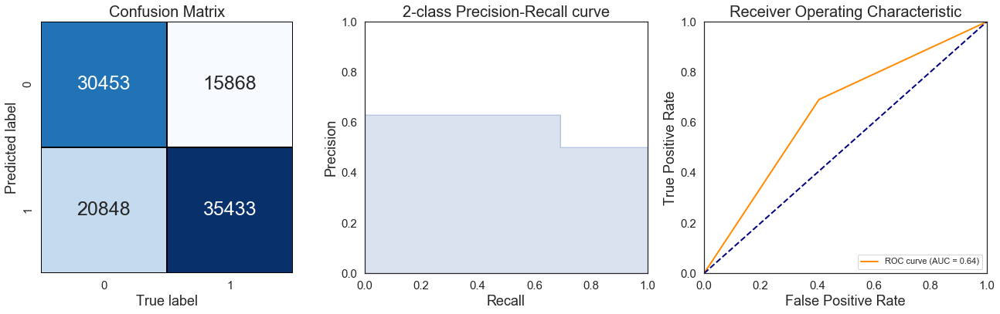

In [115]:
show_summary_report(y_train, stack_pred_train)

Accuracy : 0.5776 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1332 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.4845 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2089 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5371                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


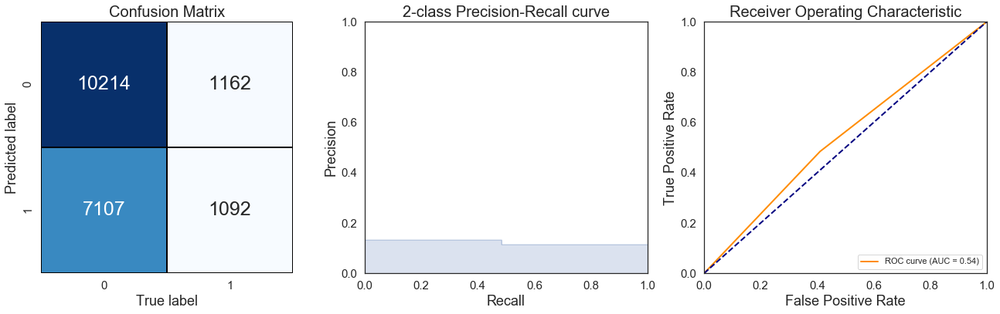

In [116]:
show_summary_report(y_test, stack_pred_test)

## Model Selection

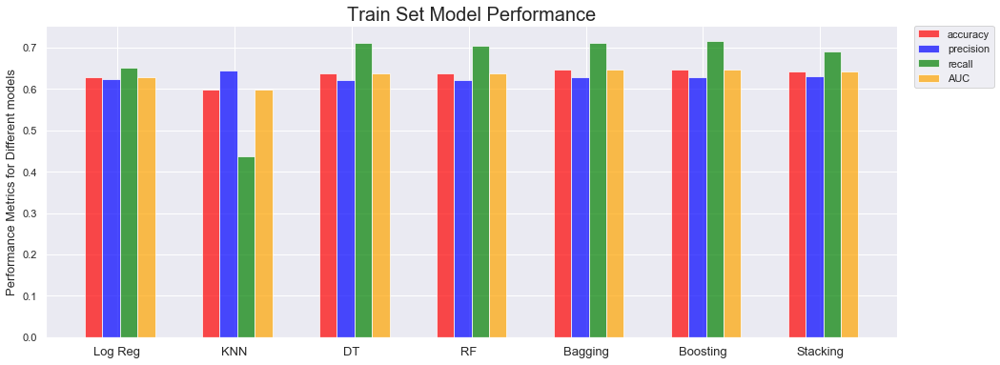

In [130]:
# plotting the performance matrics for train sets models 
plt.figure(figsize=(16, 6))
ax = plt.subplot(111)

models = ['Log Reg', 'KNN', 'DT', 'RF', 'Bagging', 'Boosting', 'Stacking']
model = np.arange(len(models))

# Accuracy
values = [accuracy_score(y_train, logreg_pred_train), accuracy_score(y_train, knn_pred_train), accuracy_score(y_train, dt_pred_train), accuracy_score(y_train, rf_pred_train), accuracy_score(y_train, bag_pred_train), accuracy_score(y_train, boost_pred_train), accuracy_score(y_train, stack_pred_train)]
plt.bar(model, values, align='center', width = 0.15, alpha=0.7, color = 'red', label= 'accuracy')


# Precision
values = [precision_score(y_train, logreg_pred_train), precision_score(y_train, knn_pred_train), precision_score(y_train, dt_pred_train), precision_score(y_train, rf_pred_train), precision_score(y_train, bag_pred_train), precision_score(y_train, boost_pred_train), precision_score(y_train, stack_pred_train)]
plt.bar(model+0.15, values, align='center', width = 0.15, alpha=0.7, color = 'blue', label = 'precision')


# Recall 
values = [recall_score(y_train, logreg_pred_train), recall_score(y_train, knn_pred_train), recall_score(y_train, dt_pred_train), recall_score(y_train, rf_pred_train), recall_score(y_train, bag_pred_train), recall_score(y_train, boost_pred_train), recall_score(y_train, stack_pred_train)]
plt.bar(model+0.3, values, align='center', width = 0.15, alpha=0.7, color = 'green', label = 'recall')


# ROC Curve
values = [roc_auc_score(y_train, logreg_pred_train), roc_auc_score(y_train, knn_pred_train), roc_auc_score(y_train, dt_pred_train), roc_auc_score(y_train, rf_pred_train), roc_auc_score(y_train, bag_pred_train), roc_auc_score(y_train, boost_pred_train), roc_auc_score(y_train, stack_pred_train)]
plt.bar(model+0.45, values, align='center', width = 0.15, alpha=0.7, color = 'orange', label = 'AUC')


plt.xticks(model+0.2, models, fontsize=13)
plt.ylabel('Performance Metrics for Different models', fontsize=13)
plt.title('Train Set Model Performance', fontsize=20)
    
# removing the axis on the top and right of the plot window
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc='upper right', bbox_to_anchor=(1.12, 1.02))

plt.show()

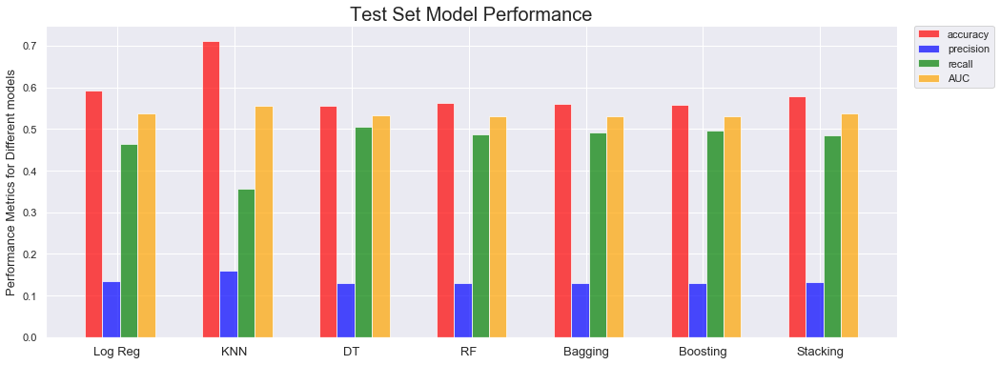

In [131]:
# plotting the performance matrics for train sets models 
plt.figure(figsize=(16, 6))
ax = plt.subplot(111)

models = ['Log Reg', 'KNN', 'DT', 'RF', 'Bagging', 'Boosting', 'Stacking']
model = np.arange(len(models))

# Accuracy
values = [accuracy_score(y_test, logreg_pred_test), accuracy_score(y_test, knn_pred_test), accuracy_score(y_test, dt_pred_test), accuracy_score(y_test, rf_pred_test), accuracy_score(y_test, bag_pred_test), accuracy_score(y_test, boost_pred_test), accuracy_score(y_test, stack_pred_test)]
plt.bar(model, values, align='center', width = 0.15, alpha=0.7, color = 'red', label= 'accuracy')


# Precision
values = [precision_score(y_test, logreg_pred_test), precision_score(y_test, knn_pred_test), precision_score(y_test, dt_pred_test), precision_score(y_test, rf_pred_test), precision_score(y_test, bag_pred_test), precision_score(y_test, boost_pred_test), precision_score(y_test, stack_pred_test)]
plt.bar(model+0.15, values, align='center', width = 0.15, alpha=0.7, color = 'blue', label = 'precision')


# Recall 
values = [recall_score(y_test, logreg_pred_test), recall_score(y_test, knn_pred_test), recall_score(y_test, dt_pred_test), recall_score(y_test, rf_pred_test), recall_score(y_test, bag_pred_test), recall_score(y_test, boost_pred_test), recall_score(y_test, stack_pred_test)]
plt.bar(model+0.3, values, align='center', width = 0.15, alpha=0.7, color = 'green', label = 'recall')


# ROC Curve
values = [roc_auc_score(y_test, logreg_pred_test), roc_auc_score(y_test, knn_pred_test), roc_auc_score(y_test, dt_pred_test), roc_auc_score(y_test, rf_pred_test), roc_auc_score(y_test, bag_pred_test), roc_auc_score(y_test, boost_pred_test), roc_auc_score(y_test, stack_pred_test)]
plt.bar(model+0.45, values, align='center', width = 0.15, alpha=0.7, color = 'orange', label = 'AUC')


plt.xticks(model+0.2, models, fontsize=13)
plt.ylabel('Performance Metrics for Different models', fontsize=13)
plt.title('Test Set Model Performance', fontsize=20)
    
# removing the axis on the top and right of the plot window
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc='upper right', bbox_to_anchor=(1.12, 1.02))

plt.show()

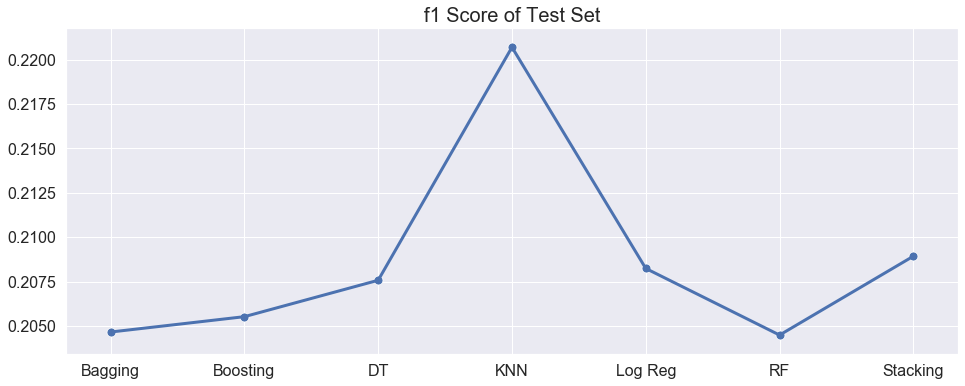

In [132]:
# plotting the performance matrics for train sets models 
plt.figure(figsize=(16, 6))
ax = plt.subplot(111)

models = ['Log Reg', 'KNN', 'DT', 'RF', 'Bagging', 'Boosting', 'Stacking']
train_f1 = [f1_score(y_train, logreg_pred_train), f1_score(y_train, knn_pred_train), f1_score(y_train, dt_pred_train), f1_score(y_train, rf_pred_train), f1_score(y_train, bag_pred_train), f1_score(y_train, boost_pred_train), f1_score(y_train, stack_pred_train)]
test_f1 = [f1_score(y_test, logreg_pred_test), f1_score(y_test, knn_pred_test), f1_score(y_test, dt_pred_test), f1_score(y_test, rf_pred_test), f1_score(y_test, bag_pred_test), f1_score(y_test, boost_pred_test), f1_score(y_test, stack_pred_test)]

sns.lineplot(x=models, y=test_f1, linewidth=3)    
sns.scatterplot(x=models, y=test_f1, s=80)   
ax.tick_params(labelsize=16)

plt.title('f1 Score of Test Set', fontsize=20)
plt.show()

In [120]:
test_recall = [recall_score(y_test, logreg_pred_test), recall_score(y_test, knn_pred_test), recall_score(y_test, dt_pred_test), recall_score(y_test, rf_pred_test), recall_score(y_test, bag_pred_test), recall_score(y_test, boost_pred_test), recall_score(y_test, stack_pred_test)]
test_precision = [precision_score(y_test, logreg_pred_test), precision_score(y_test, knn_pred_test), precision_score(y_test, dt_pred_test), precision_score(y_test, rf_pred_test), precision_score(y_test, bag_pred_test), precision_score(y_test, boost_pred_test), precision_score(y_test, stack_pred_test)]


model_f1 = pd.DataFrame({'Model': models, 'Recall': test_recall, 'Precision': test_precision, 'f1 Score': test_f1})
model_f1

,Model,Recall,Precision,f1 Score
0,Log Reg,0.465,0.134,0.208
1,KNN,0.356,0.160,0.221
2,DT,0.505,0.131,0.208
3,RF,0.488,0.129,0.204
4,Bagging,0.492,0.129,0.205
5,Boosting,0.496,0.130,0.206
6,Stacking,0.484,0.133,0.209


- KNN has the highest test f1 score out of all models 

Findings:
- DT, RF, Bagging, Boosting and Stacking show similar result with very minor difference in the recall rate. 
- Based on the two plots above, KNN method is chosen as the best model.
    - least overfitting compared to other models
    - highest f1 score 0.22: a measure of model accuracy that considers both the precision and the recall of the model 
    - precision 0.16: percentage of predicted values that are relevant 
    - recall 0.36: percentage of total relevant results that are correctly classified by the model

## Final Evaluation 

In [121]:
# Model Validation on X_val_kbest Set
knn_pred_val = knn.predict(X_val_kbest)

Accuracy : 0.7144 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.1657 [TP / (TP + FP)] Not to label non-readmission as readmitted.        Best: 1, Worst: 0
Recall   : 0.3595 [TP / (TP + FN)] Find all the readmissions.                         Best: 1, Worst: 0
f1 Score : 0.2268 [2 * (precision * recall) / (precision + recall)]                   Best: 1, Worst: 0
ROC AUC  : 0.5603                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


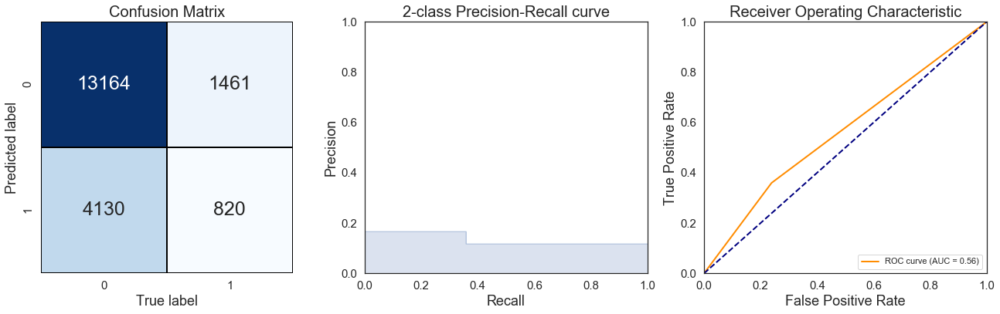

In [122]:
show_summary_report(y_val, knn_pred_val)

In [123]:
metrics = ['Accuracy', 'AUC', 'Recall', 'Precision', 'f1 Score']
train = [accuracy_score(y_train, knn_pred_train), roc_auc_score(y_train, knn_pred_train), recall_score(y_train, knn_pred_train), precision_score(y_train, knn_pred_train), f1_score(y_train, knn_pred_train)]
test = [accuracy_score(y_test, knn_pred_test), roc_auc_score(y_test, knn_pred_test), recall_score(y_test, knn_pred_test), precision_score(y_test, knn_pred_test), f1_score(y_test, knn_pred_test)]
validation = [accuracy_score(y_val, knn_pred_val), roc_auc_score(y_val, knn_pred_val), recall_score(y_val, knn_pred_val), precision_score(y_val, knn_pred_val), f1_score(y_val, knn_pred_val)]

model_f1 = pd.DataFrame({'Train Set': train, 'Test Set': test, 'Val Set': validation}, index=metrics)
model_f1

,Train Set,Test Set,Val Set
Accuracy,0.599,0.711,0.714
AUC,0.599,0.556,0.560
Recall,0.437,0.356,0.359
Precision,0.646,0.160,0.166
f1 Score,0.521,0.221,0.227


- Similar performances between test and val sets, suggesting that the model fits ‘unseen’ data as expected. 
- Based on recall, final model is able to predict 35% of actual readmission.
- Based on precision, 16% of the predicted readmissions are actual readmissions. 
- f1 score ranges between 0.22 and 0.23

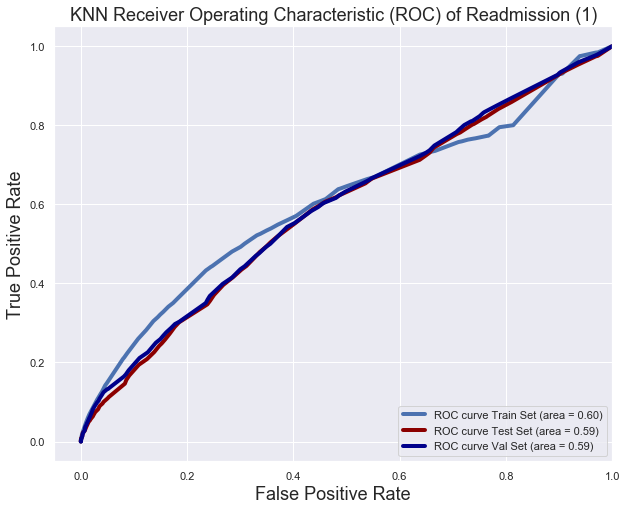

In [133]:
# ROC Curve for Train, Test, Validation Sets of the Final Model 
y_pp_train = knn.predict_proba(X_train_kbest)
y_pp_test = knn.predict_proba(X_test_kbest)
y_pp_val = knn.predict_proba(X_val_kbest) 

# Store the false positive rate(fpr), true positive rate (tpr) in vectors for use in the graph
fpr_train, tpr_train, _ = roc_curve(y_train, y_pp_train[:,1]) 
fpr_test, tpr_test, _ = roc_curve(y_test, y_pp_test[:,1])
fpr_val, tpr_val, _ = roc_curve(y_val, y_pp_val[:,1]) 


# Plot the ROC Curve
plt.figure(figsize=[10,8])
plt.plot(fpr_train, tpr_train, label='ROC curve Train Set (area = %0.2f)' % auc(fpr_train, tpr_train), linewidth=4)
plt.plot(fpr_test, tpr_test, label='ROC curve Test Set (area = %0.2f)' % auc(fpr_test, tpr_test), linewidth=4, color='darkred')
plt.plot(fpr_val, tpr_val, label='ROC curve Val Set (area = %0.2f)' % auc(fpr_val, tpr_val), linewidth=4, color='darkblue')
    

plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.title('KNN Receiver Operating Characteristic (ROC) of Readmission (1)', fontsize=18)
plt.legend(loc="lower right")

- KNN shows similar ROC curve between train, test and val sets

In [126]:
print('Final Model f1 score is {:.3f}'.format(f1_score(y_val, knn_pred_val)))

Final Model f1 score is 0.227


Conclusion: 
- KNN is chosen as the best model 
- Hyper-parameters where chosen using randomized search with 5-fold cross validation
- Several techniques such as feature engineering, feature selection, randomised search and cross validation have been attempted in refining the model. 
- Despite all the attempts, KNN model is still unable to capture the real-world problem of accurately identify diabetic patients who will be readmitted due to low correlation between the features and outcome variable. 
- Based on recall score, final model is only able to accurately predict 35% of readmission. 
- However, based on precision score, out of all the predicted readmissions, only 16% are actual readmissions
- f1 score find the balance between precision and recall, the f1 score is 0.22